In [1]:
import torch
from torch import nn
from torch.optim import Adam
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import os 
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import random
import numpy as np

%matplotlib inline

In [2]:
def random_noise(batch_size, channels, side_size):
    return torch.randn(batch_size, channels, side_size, side_size).cuda()

In [3]:
def visualise(imgs, rows=2):
    imgs = imgs.transpose(1, 3)
    imgs = torch.cat([imgs[i::rows] for i in range(rows)], dim=1)
    cols = len(imgs)
    imgs = (torch.cat(list(imgs), dim=1)).cpu().numpy()[:, :, ::-1]

    imgs = (imgs+1)/2  ### valid range   
    
    plt.figure(figsize=(cols*1.5, rows*1.5))
    plt.imshow(imgs)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [6]:
class CatDataset(Dataset):
    def __init__(self, path_to_dataset="cat_136", size=128):
        self.photo_names = os.listdir(path_to_dataset)
        self.path_base = path_to_dataset
        self.size = size
    
    def __getitem__(self, index):
        path = self.path_base + "/" + self.photo_names[index]
        img = cv2.imread(path) # 136 x 136
        crop_rate = 8
        x_crop = random.randint(0, crop_rate)
        y_crop = random.randint(0, crop_rate)
        img = img[x_crop:136 - crop_rate + x_crop, y_crop:136 - crop_rate + y_crop]
        img = cv2.resize(img, (self.size, self.size), interpolation=cv2.INTER_CUBIC)
        return 2 * torch.tensor(img).float().transpose(0, 2) / 255. - 1
    
    def __len__(self):
        return len(self.photo_names)

# VAE

# Encoder

In [8]:
def conv_block(in_f, out_f, *args, **kwargs):
    return nn.Sequential(
        nn.Conv2d(in_f, out_f, *args, **kwargs),
        nn.BatchNorm2d(out_f),
        nn.ReLU())   

In [9]:
class Encoder(nn.Module):
    def __init__(self, downsamplings, down_channels, latent_size):
        super(Encoder, self).__init__()
        after_down_channels = down_channels * 2**downsamplings ### 1024
        self.mu = None
        self.sigma = None
        
        # in layer
        self.in_layer = nn.Conv2d(3, down_channels, kernel_size=1, stride=1, padding=0)

        # conv2d xN
        enc_sizes = [down_channels*(2**i) for i in range(downsamplings + 1)]

        conv_blocks = [conv_block(in_f, out_f, kernel_size=4, stride=2, padding=1) 
                       for in_f, out_f in zip(enc_sizes[:-1], enc_sizes[1:])] 

        self.xN = nn.Sequential(*conv_blocks)
        
        # out layer
        self.out_layer = nn.Conv2d(after_down_channels, 2*latent_size, kernel_size=1, stride=1, padding=0)
        
    def forward(self, x):
        out = self.in_layer(x)
        out = self.xN(out)
        out = self.out_layer(out)

        ### mu, sigma, rand
        mu, sigma = torch.split(out, out.shape[1]//2, dim=1)
        sigma = torch.exp(sigma)
        self.mu = mu
        self.sigma = sigma

        normal = torch.rand_like(sigma)
        normal = normal.to(mu.device)
        z = normal * sigma + mu
        return z

# Decoder

In [10]:
def conv_transe_block(in_f, out_f, *args, **kwargs):
    return nn.Sequential(
        nn.ConvTranspose2d(in_f, out_f, *args, **kwargs),
        nn.BatchNorm2d(out_f),
        nn.ReLU())  

In [11]:
class Decoder(nn.Module):
    def __init__(self, upsamplings, latent_size, up_channels):
        super(Decoder, self).__init__()

        before_up_channels = up_channels * 2**upsamplings
    
        ### in_layer
        self.in_layer = nn.Conv2d(latent_size, before_up_channels, kernel_size=1, stride=1, padding=0, bias=False)
        
        ### xN
        enc_sizes = [before_up_channels//(2**i) for i in range(upsamplings + 1)]
        
        conv_transe_blocks = [conv_transe_block(in_f, out_f, kernel_size=4, stride=2, padding=1, bias=False) 
                       for in_f, out_f in zip(enc_sizes[:-1], enc_sizes[1:])]
        
        self.xN = nn.Sequential(*conv_transe_blocks)       
        
        ### out_layer
        self.out_layer = nn.Sequential(
            nn.Conv2d(up_channels, 3, kernel_size=1, stride=1, padding=0),
            nn.Tanh())

        
    def forward(self, z):
        out = self.in_layer(z)
        out = self.xN(out)
        out = self.out_layer(out)
        return out

# VAE

In [12]:
class VAE(nn.Module):
    def __init__(self, img_size=128, latent_size=512, down_channels=8, up_channels=16):
        super(VAE, self).__init__()
        upsamplings = downsamplings = int(np.log2(img_size))
        self.encoder = Encoder(downsamplings, down_channels, latent_size)
        self.decoder = Decoder(upsamplings, latent_size, up_channels)
        
    def forward(self, x):
        z = self.encode(x)  # вектор из распределения N()
        mu, sigma = self.encoder.mu, self.encoder.sigma
        kld = 0.5*(sigma + mu**2 - torch.log(sigma) - 1) # дивергенция 
        x_pred = self.decode(z) # восстановленная картинка
        return x_pred, kld
    
    def encode(self, x):
        z = self.encoder.forward(x) # вектор из распределения N()
        return z
    
    def decode(self, z):
        x_pred = self.decoder.forward(z) # восстановленная картинка
        return x_pred

# Train


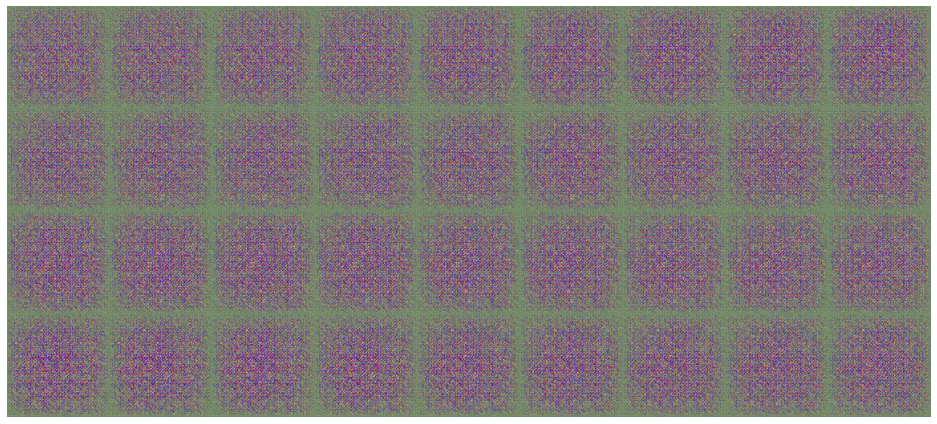

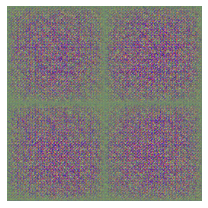


Epoch 1 | Reconstruction loss: 8768.13272454872 | KLD loss: 139.7509086146858



Epoch 2 | Reconstruction loss: 7055.19206815921 | KLD loss: 174.83892644562337



Epoch 3 | Reconstruction loss: 6664.320468689344 | KLD loss: 194.06772696453592



Epoch 4 | Reconstruction loss: 6376.283294867285 | KLD loss: 204.1600837233644



Epoch 5 | Reconstruction loss: 6182.290928431919 | KLD loss: 214.19379316057478



Epoch 6 | Reconstruction loss: 5986.018560374006 | KLD loss: 222.2656708474485



Epoch 7 | Reconstruction loss: 5798.393139951718 | KLD loss: 234.9789527513966



Epoch 8 | Reconstruction loss: 5598.498653056458 | KLD loss: 242.86393823090546



Epoch 9 | Reconstruction loss: 5514.306971958706 | KLD loss: 251.83734609473566



Epoch 10 | Reconstruction loss: 5424.390015406638 | KLD loss: 255.41336914915476


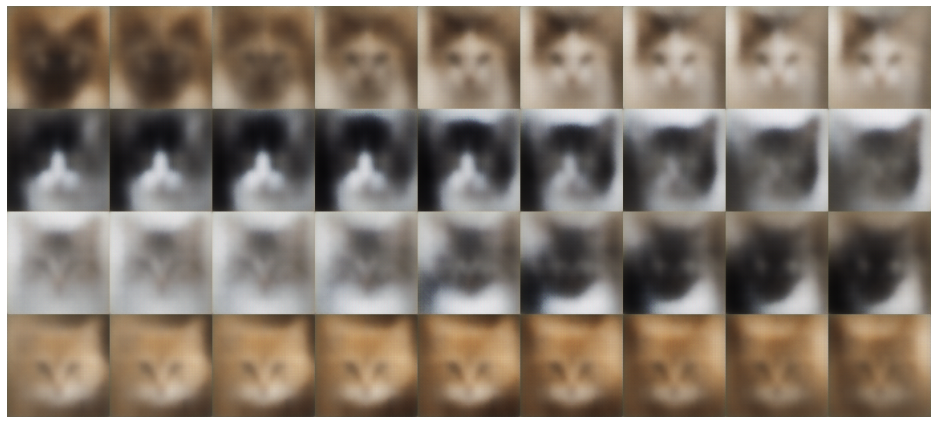

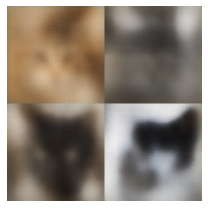


Epoch 11 | Reconstruction loss: 5316.2275762143345 | KLD loss: 262.89872087751115



Epoch 12 | Reconstruction loss: 5216.490414826766 | KLD loss: 266.7468321427055



Epoch 13 | Reconstruction loss: 5103.549889226878 | KLD loss: 273.28304788340694



Epoch 14 | Reconstruction loss: 5019.030572926776 | KLD loss: 280.64982109780635



Epoch 15 | Reconstruction loss: 4967.491812569754 | KLD loss: 284.8708957411488



Epoch 16 | Reconstruction loss: 4911.367848271909 | KLD loss: 288.3786589344096



Epoch 17 | Reconstruction loss: 4845.89937084506 | KLD loss: 294.023616008877



Epoch 18 | Reconstruction loss: 4845.08842250279 | KLD loss: 298.1623620927704



Epoch 19 | Reconstruction loss: 4800.348451223433 | KLD loss: 301.7158210707007



Epoch 20 | Reconstruction loss: 4747.940041867842 | KLD loss: 304.35327859250657


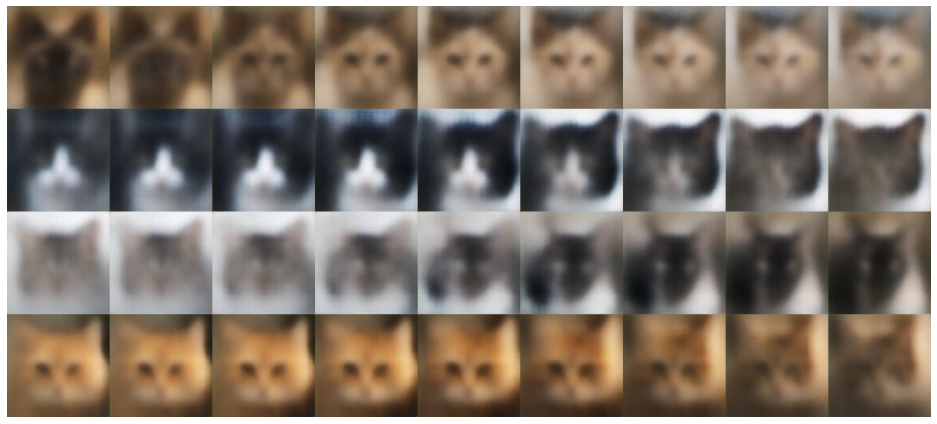

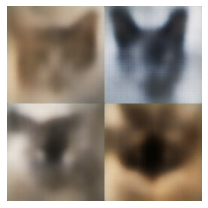


Epoch 21 | Reconstruction loss: 4698.685761824898 | KLD loss: 308.3754496604019



Epoch 22 | Reconstruction loss: 4638.771718279915 | KLD loss: 310.14026821918367



Epoch 23 | Reconstruction loss: 4604.279506896593 | KLD loss: 311.8276939155152



Epoch 24 | Reconstruction loss: 4563.67377391365 | KLD loss: 313.92396554887665



Epoch 25 | Reconstruction loss: 4508.890555245535 | KLD loss: 313.3404749520817



Epoch 26 | Reconstruction loss: 4503.2744299847145 | KLD loss: 316.4964214348645



Epoch 27 | Reconstruction loss: 4424.3656077888445 | KLD loss: 318.41871173929724



Epoch 28 | Reconstruction loss: 4411.355573381697 | KLD loss: 323.00316520359206



Epoch 29 | Reconstruction loss: 4387.871499387374 | KLD loss: 323.45929234664635



Epoch 30 | Reconstruction loss: 4316.422815547967 | KLD loss: 323.30018729452763


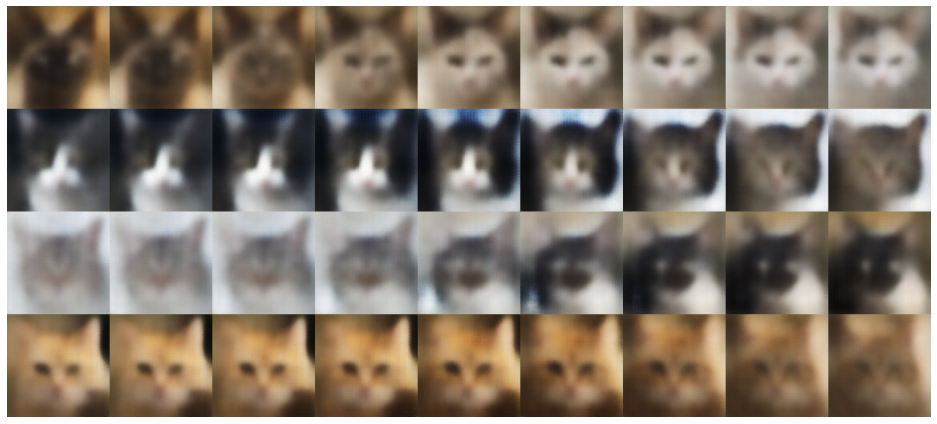

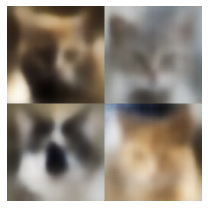


Epoch 31 | Reconstruction loss: 4293.126770398631 | KLD loss: 322.3845161769701



Epoch 32 | Reconstruction loss: 4284.999231942692 | KLD loss: 324.70150567285765



Epoch 33 | Reconstruction loss: 4264.955808651373 | KLD loss: 327.22042870373457



Epoch 34 | Reconstruction loss: 4222.948018897394 | KLD loss: 328.17520004177686



Epoch 35 | Reconstruction loss: 4203.180321355784 | KLD loss: 329.4866870856433



Epoch 36 | Reconstruction loss: 4161.242101444221 | KLD loss: 331.2148657378203



Epoch 37 | Reconstruction loss: 4157.219812997379 | KLD loss: 334.252074105399



Epoch 38 | Reconstruction loss: 4118.56460514424 | KLD loss: 333.8512785064508



Epoch 39 | Reconstruction loss: 4087.179216657366 | KLD loss: 333.1604392484108



Epoch 40 | Reconstruction loss: 4087.9290976198563 | KLD loss: 337.99118563255166


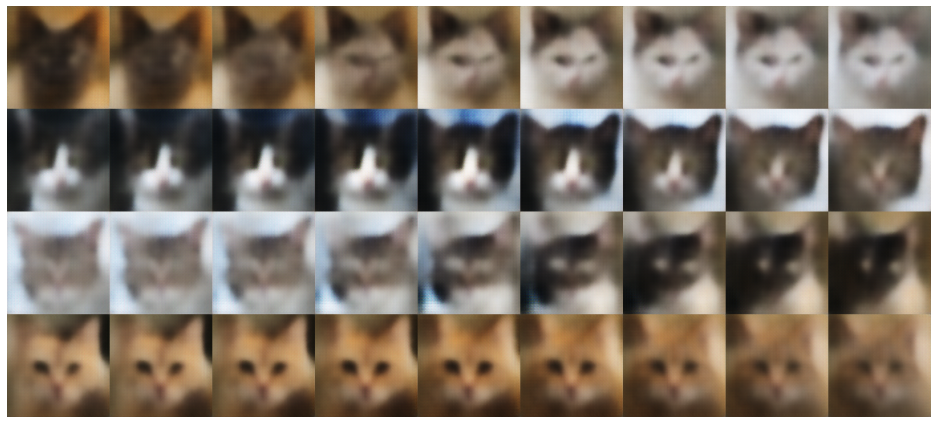

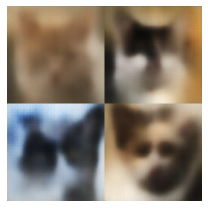


Epoch 41 | Reconstruction loss: 4062.793861531323 | KLD loss: 340.3119006423476



Epoch 42 | Reconstruction loss: 4027.9207960804056 | KLD loss: 339.59874365196464



Epoch 43 | Reconstruction loss: 4016.5241934260966 | KLD loss: 339.8128454078058



Epoch 44 | Reconstruction loss: 4008.7183121390963 | KLD loss: 342.89663089728504



Epoch 45 | Reconstruction loss: 3979.077207956255 | KLD loss: 339.6161413251983



Epoch 46 | Reconstruction loss: 3952.4178205217636 | KLD loss: 342.19451131879913



Epoch 47 | Reconstruction loss: 3961.7073671329094 | KLD loss: 343.32348206324605



Epoch 48 | Reconstruction loss: 3909.9423782632957 | KLD loss: 345.3128674904012



Epoch 49 | Reconstruction loss: 3913.331709014703 | KLD loss: 346.3809646227345



Epoch 50 | Reconstruction loss: 3901.324594438446 | KLD loss: 345.3546201812555


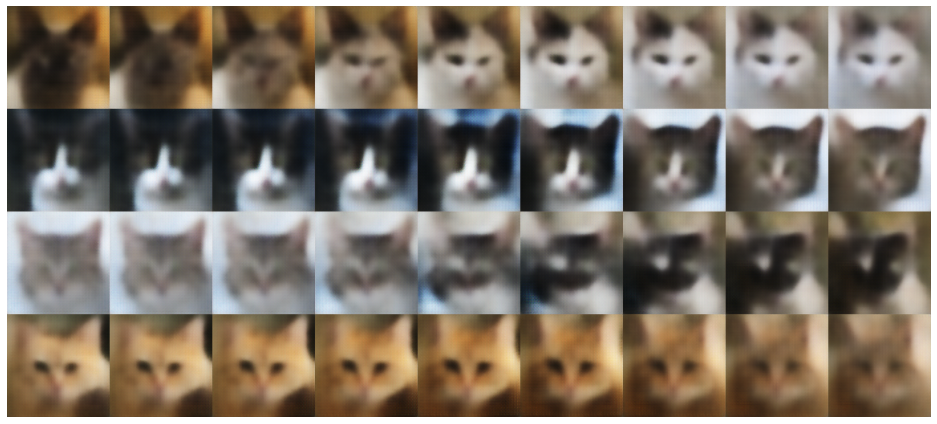

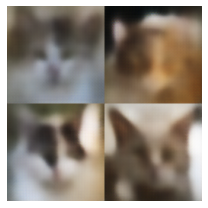


Epoch 51 | Reconstruction loss: 3863.607450307526 | KLD loss: 345.66176766342255



Epoch 52 | Reconstruction loss: 3851.6615805300125 | KLD loss: 343.782692097729



Epoch 53 | Reconstruction loss: 3836.5131650178328 | KLD loss: 345.90679258737504



Epoch 54 | Reconstruction loss: 3830.5638761342684 | KLD loss: 346.0486394751886



Epoch 55 | Reconstruction loss: 3792.8511034094768 | KLD loss: 345.48011386468545



Epoch 56 | Reconstruction loss: 3803.7392161114617 | KLD loss: 345.6689891459779



Epoch 57 | Reconstruction loss: 3768.9116002432306 | KLD loss: 346.83597076605565



Epoch 58 | Reconstruction loss: 3762.00430771727 | KLD loss: 349.58437461142216



Epoch 59 | Reconstruction loss: 3750.134978300296 | KLD loss: 349.22167409576986



Epoch 60 | Reconstruction loss: 3732.0393073988257 | KLD loss: 347.4357909682375


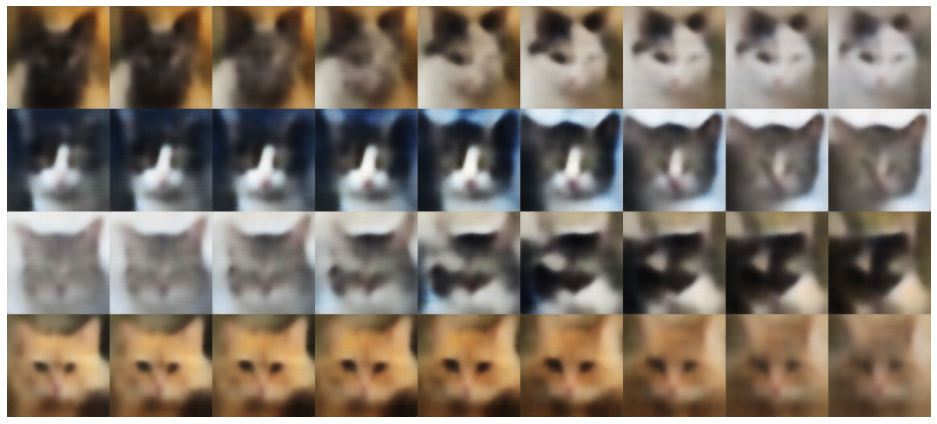

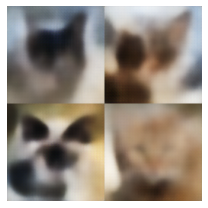


Epoch 61 | Reconstruction loss: 3706.5545847638055 | KLD loss: 350.1717798458123



Epoch 62 | Reconstruction loss: 3693.1333754640186 | KLD loss: 347.6463174760712



Epoch 63 | Reconstruction loss: 3706.647295649748 | KLD loss: 348.886799024499



Epoch 64 | Reconstruction loss: 3674.5140577991556 | KLD loss: 349.05590934042607



Epoch 65 | Reconstruction loss: 3674.857359702543 | KLD loss: 348.3888306706588



Epoch 66 | Reconstruction loss: 3668.1416519828463 | KLD loss: 349.9617879642463



Epoch 67 | Reconstruction loss: 3640.8695003912317 | KLD loss: 351.52209207286006



Epoch 68 | Reconstruction loss: 3626.9253786454287 | KLD loss: 351.46109970756197



Epoch 69 | Reconstruction loss: 3607.402296362456 | KLD loss: 351.0356870378767



Epoch 70 | Reconstruction loss: 3604.6800904836714 | KLD loss: 351.79709966434456


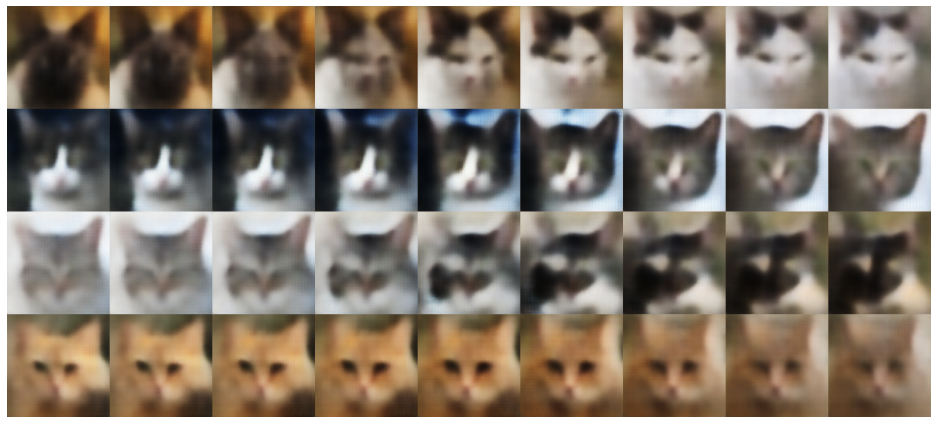

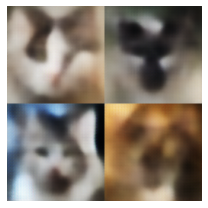


Epoch 71 | Reconstruction loss: 3586.59767785872 | KLD loss: 351.94084195912995



Epoch 72 | Reconstruction loss: 3589.8361152980638 | KLD loss: 349.92955377235177



Epoch 73 | Reconstruction loss: 3577.1906256823804 | KLD loss: 351.04631810158673



Epoch 74 | Reconstruction loss: 3567.668996111947 | KLD loss: 352.3520157618552



Epoch 75 | Reconstruction loss: 3547.345814770053 | KLD loss: 353.2252387289675



Epoch 76 | Reconstruction loss: 3555.849152559079 | KLD loss: 350.1994737423725



Epoch 77 | Reconstruction loss: 3531.1863987134852 | KLD loss: 351.5948081638502



Epoch 78 | Reconstruction loss: 3526.9818369231607 | KLD loss: 352.3936628732622



Epoch 79 | Reconstruction loss: 3502.0936529503106 | KLD loss: 349.6526472672172



Epoch 80 | Reconstruction loss: 3513.6608029951963 | KLD loss: 350.5584008353097


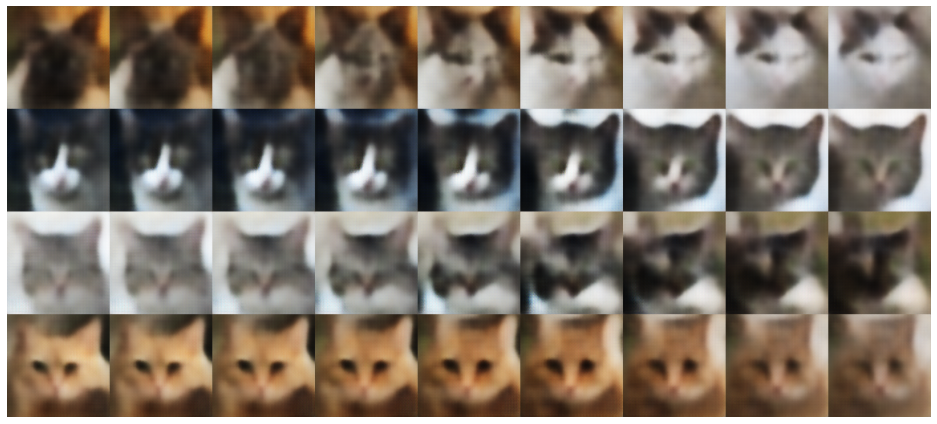

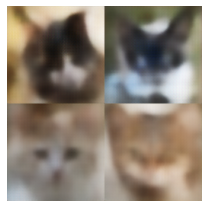


Epoch 81 | Reconstruction loss: 3490.67677942122 | KLD loss: 349.7548469401294



Epoch 82 | Reconstruction loss: 3499.39068982616 | KLD loss: 351.35361352766523



Epoch 83 | Reconstruction loss: 3465.620787816018 | KLD loss: 351.14692550564405



Epoch 84 | Reconstruction loss: 3461.056261524651 | KLD loss: 351.1375525338309



Epoch 85 | Reconstruction loss: 3437.5048672693856 | KLD loss: 349.4744962609333



Epoch 86 | Reconstruction loss: 3452.7824688076234 | KLD loss: 349.5325609290081



Epoch 87 | Reconstruction loss: 3442.0619764624175 | KLD loss: 351.88541407614764



Epoch 88 | Reconstruction loss: 3425.2988159937886 | KLD loss: 351.7735132252948



Epoch 89 | Reconstruction loss: 3426.364605826621 | KLD loss: 351.87874181522346



Epoch 90 | Reconstruction loss: 3409.5382104719647 | KLD loss: 349.87428397421513


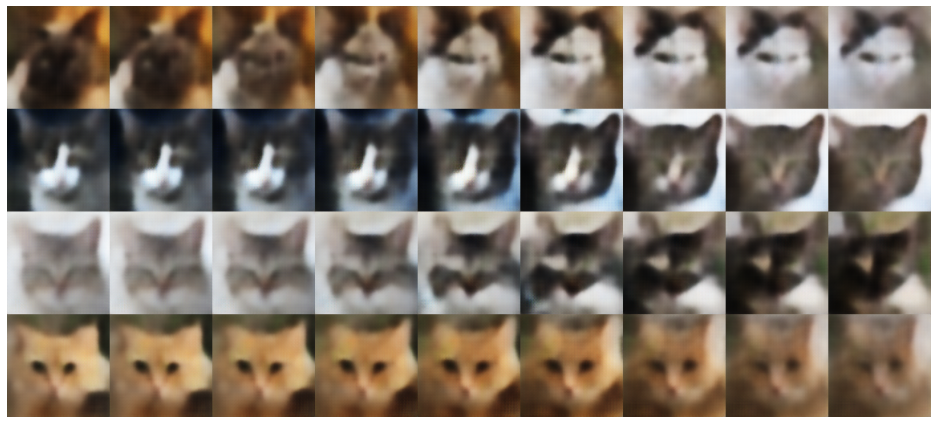

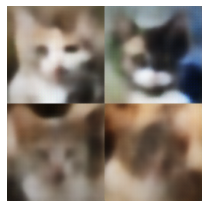


Epoch 91 | Reconstruction loss: 3416.0215222850347 | KLD loss: 349.99036810264823



Epoch 92 | Reconstruction loss: 3390.7187374896885 | KLD loss: 351.0360912536242



Epoch 93 | Reconstruction loss: 3377.18816171966 | KLD loss: 348.87970743120087



Epoch 94 | Reconstruction loss: 3383.6137592955406 | KLD loss: 350.87280420338885



Epoch 95 | Reconstruction loss: 3368.4091952306144 | KLD loss: 349.2412803602515



Epoch 96 | Reconstruction loss: 3350.5852012871214 | KLD loss: 348.45341908709605



Epoch 97 | Reconstruction loss: 3348.9955029221055 | KLD loss: 348.3477557638417



Epoch 98 | Reconstruction loss: 3345.6491532414598 | KLD loss: 348.57749114421586



Epoch 99 | Reconstruction loss: 3323.937444651349 | KLD loss: 347.7606341439004



Epoch 100 | Reconstruction loss: 3341.12710514424 | KLD loss: 350.6417704990932


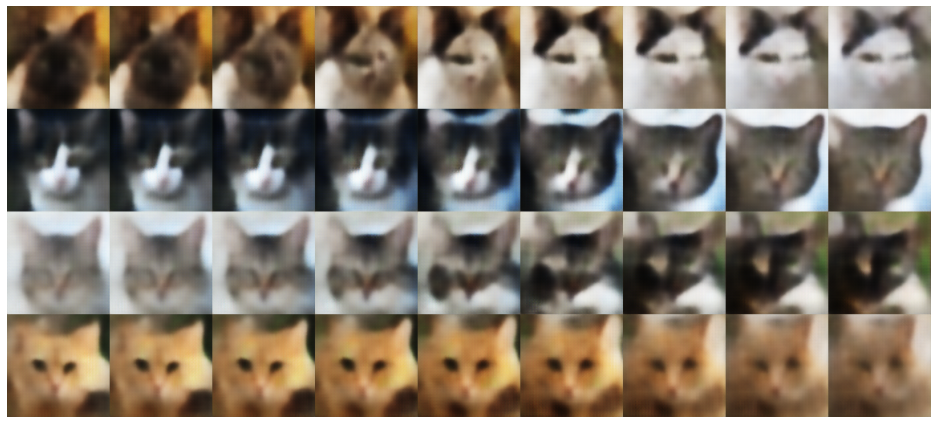

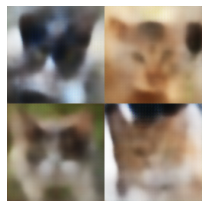


Epoch 101 | Reconstruction loss: 3311.9974289414304 | KLD loss: 349.9738739203222



Epoch 102 | Reconstruction loss: 3310.4346753232967 | KLD loss: 349.5063706392087



Epoch 103 | Reconstruction loss: 3304.9245396963556 | KLD loss: 347.77992646590525



Epoch 104 | Reconstruction loss: 3294.9745744977677 | KLD loss: 348.8973678209767



Epoch 105 | Reconstruction loss: 3292.6592369316527 | KLD loss: 349.3487926032973



Epoch 106 | Reconstruction loss: 3278.5149331418625 | KLD loss: 347.7693320327664



Epoch 107 | Reconstruction loss: 3266.304932019725 | KLD loss: 348.796167503973



Epoch 108 | Reconstruction loss: 3265.48828125 | KLD loss: 348.12748481324



Epoch 109 | Reconstruction loss: 3276.123933211617 | KLD loss: 348.9098807388211



Epoch 110 | Reconstruction loss: 3259.1457242787997 | KLD loss: 348.91219808448176


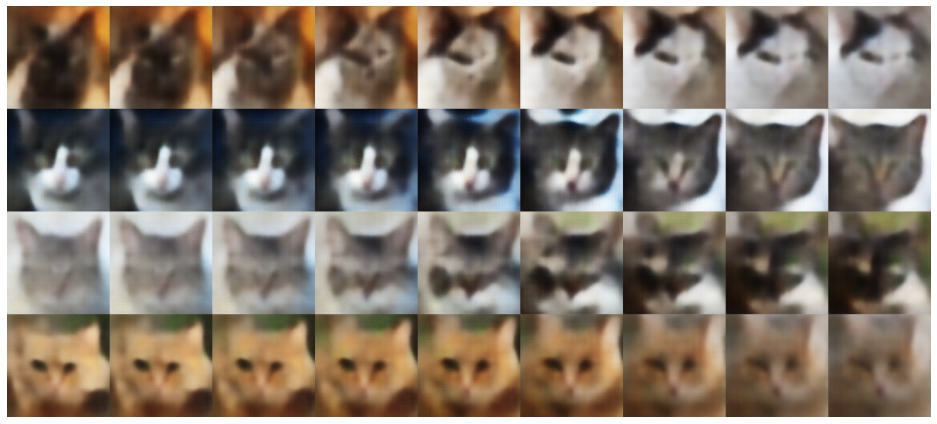

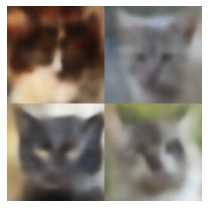


Epoch 111 | Reconstruction loss: 3240.6427923166975 | KLD loss: 347.04202412670446



Epoch 112 | Reconstruction loss: 3227.015010857434 | KLD loss: 347.8992848366684



Epoch 113 | Reconstruction loss: 3237.910523219138 | KLD loss: 347.26693464954445



Epoch 114 | Reconstruction loss: 3222.995218407293 | KLD loss: 347.3522202864937



Epoch 115 | Reconstruction loss: 3229.2451657123447 | KLD loss: 349.64199909660385



Epoch 116 | Reconstruction loss: 3205.8868851750535 | KLD loss: 347.597953559449



Epoch 117 | Reconstruction loss: 3203.8997867181433 | KLD loss: 347.0016147779382



Epoch 118 | Reconstruction loss: 3182.185797460331 | KLD loss: 347.09811733079994



Epoch 119 | Reconstruction loss: 3190.51563599391 | KLD loss: 346.6814130700153



Epoch 120 | Reconstruction loss: 3180.6993046162293 | KLD loss: 346.3272765260306


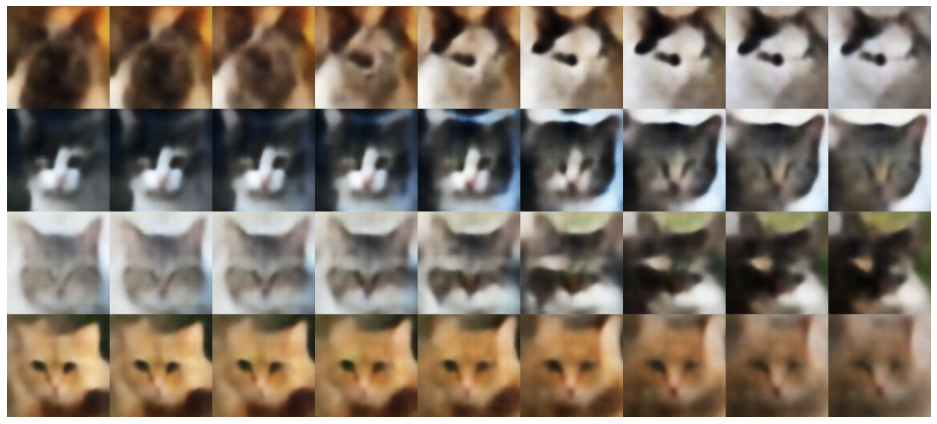

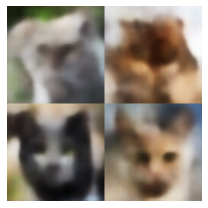


Epoch 121 | Reconstruction loss: 3172.591771854377 | KLD loss: 346.86907451937657



Epoch 122 | Reconstruction loss: 3179.4556630768393 | KLD loss: 345.1052574963303



Epoch 123 | Reconstruction loss: 3164.754734205163 | KLD loss: 344.51947301070885



Epoch 124 | Reconstruction loss: 3139.6800139054008 | KLD loss: 345.0395102649002



Epoch 125 | Reconstruction loss: 3156.2859159671 | KLD loss: 344.4292518189235



Epoch 126 | Reconstruction loss: 3148.660849624539 | KLD loss: 344.00486963876284



Epoch 127 | Reconstruction loss: 3147.515987419934 | KLD loss: 345.54200242320945



Epoch 128 | Reconstruction loss: 3126.5187213021036 | KLD loss: 345.0772882781414



Epoch 129 | Reconstruction loss: 3125.7423126031154 | KLD loss: 344.9665179993055



Epoch 130 | Reconstruction loss: 3124.8741843655985 | KLD loss: 343.5750910599039


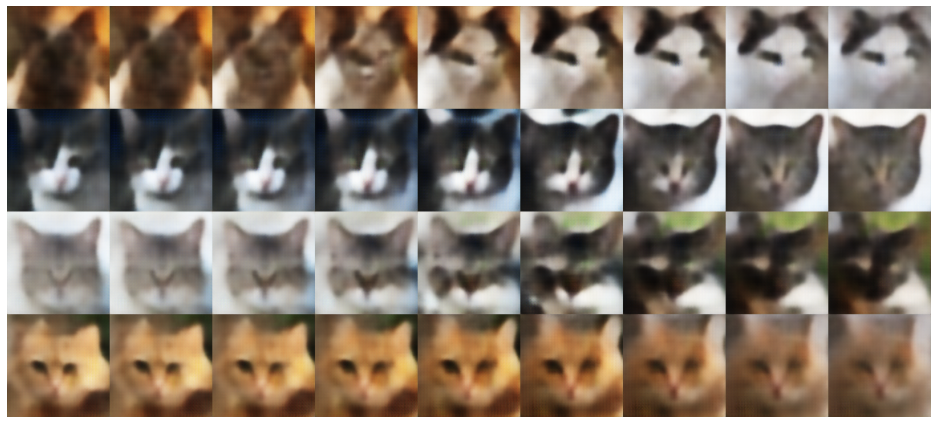

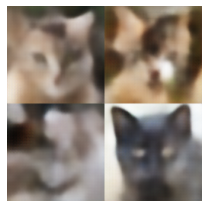


Epoch 131 | Reconstruction loss: 3112.889527883589 | KLD loss: 343.6673782064308



Epoch 132 | Reconstruction loss: 3099.8722845041975 | KLD loss: 345.7159167461514



Epoch 133 | Reconstruction loss: 3104.0565545692207 | KLD loss: 345.3262394022497



Epoch 134 | Reconstruction loss: 3100.2509250048524 | KLD loss: 345.8567967385239



Epoch 135 | Reconstruction loss: 3086.115363648219 | KLD loss: 342.80953903672116



Epoch 136 | Reconstruction loss: 3090.061415962551 | KLD loss: 343.60498506534174



Epoch 137 | Reconstruction loss: 3076.9695739746094 | KLD loss: 343.76235042595715



Epoch 138 | Reconstruction loss: 3073.5366737886984 | KLD loss: 343.68214046881064



Epoch 139 | Reconstruction loss: 3067.2635575762447 | KLD loss: 342.9814671581576



Epoch 140 | Reconstruction loss: 3065.6762934145722 | KLD loss: 342.3343345215602


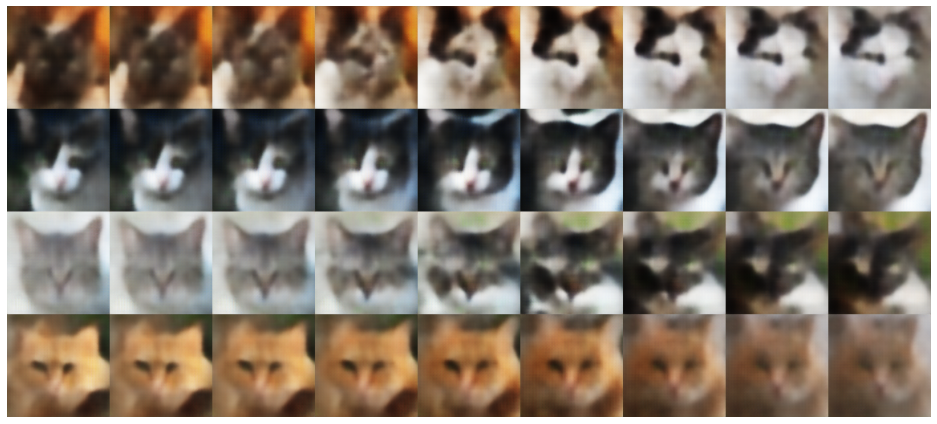

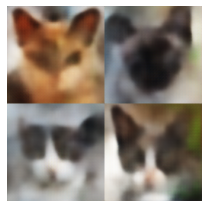


Epoch 141 | Reconstruction loss: 3062.4114597865514 | KLD loss: 342.2088188029224



Epoch 142 | Reconstruction loss: 3052.14542099852 | KLD loss: 341.44964827069583



Epoch 143 | Reconstruction loss: 3044.4780815551 | KLD loss: 341.6583900688598



Epoch 144 | Reconstruction loss: 3042.09258900518 | KLD loss: 340.56333207787935



Epoch 145 | Reconstruction loss: 3036.5308426566744 | KLD loss: 339.7985133295474



Epoch 146 | Reconstruction loss: 3036.6003285283628 | KLD loss: 339.1309257649487



Epoch 147 | Reconstruction loss: 3029.6660874645163 | KLD loss: 340.55864194313193



Epoch 148 | Reconstruction loss: 3016.4295254346007 | KLD loss: 341.25037876863655



Epoch 149 | Reconstruction loss: 3016.825622937694 | KLD loss: 340.6980163858544



Epoch 150 | Reconstruction loss: 3000.819214435838 | KLD loss: 341.20055503134404


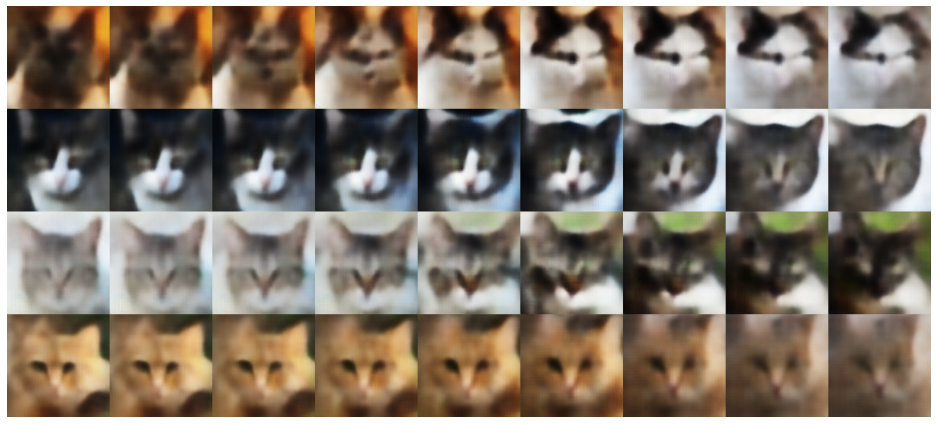

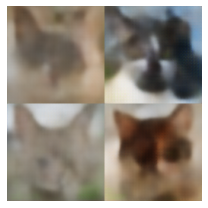


Epoch 151 | Reconstruction loss: 3005.997019323503 | KLD loss: 341.78009303312126



Epoch 152 | Reconstruction loss: 3001.7319550129196 | KLD loss: 341.10984769074815



Epoch 153 | Reconstruction loss: 2994.7893451193104 | KLD loss: 339.05899526465754



Epoch 154 | Reconstruction loss: 2996.988458479413 | KLD loss: 341.62487930392626



Epoch 155 | Reconstruction loss: 2985.735031412255 | KLD loss: 339.61296683364776



Epoch 156 | Reconstruction loss: 2988.71143677516 | KLD loss: 338.8854472948157



Epoch 157 | Reconstruction loss: 2975.2118422229837 | KLD loss: 339.0896712119535



Epoch 158 | Reconstruction loss: 2974.222107123144 | KLD loss: 340.16411149872016



Epoch 159 | Reconstruction loss: 2976.0985486522222 | KLD loss: 338.75571915525825



Epoch 160 | Reconstruction loss: 2968.719875359387 | KLD loss: 339.67426423256444


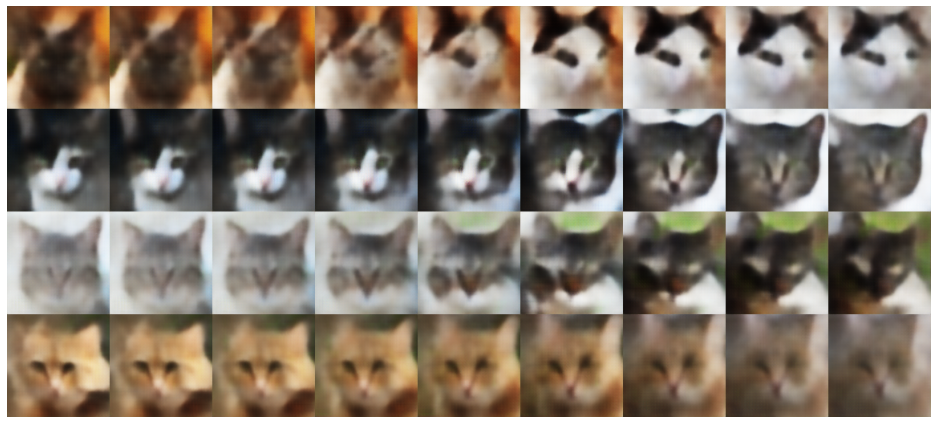

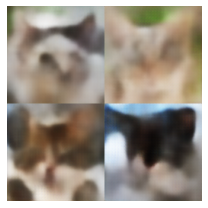


Epoch 161 | Reconstruction loss: 2959.426553856512 | KLD loss: 336.71497122249247



Epoch 162 | Reconstruction loss: 2944.7164141731973 | KLD loss: 337.2308975598827



Epoch 163 | Reconstruction loss: 2952.4872800459775 | KLD loss: 336.44192865028145



Epoch 164 | Reconstruction loss: 2944.5681249014337 | KLD loss: 336.73885956758295



Epoch 165 | Reconstruction loss: 2937.624035189611 | KLD loss: 336.64112460687295



Epoch 166 | Reconstruction loss: 2942.8976413892665 | KLD loss: 336.55498973775354



Epoch 167 | Reconstruction loss: 2934.569627465669 | KLD loss: 335.38843991297375



Epoch 168 | Reconstruction loss: 2933.02702947581 | KLD loss: 335.4283009878597



Epoch 169 | Reconstruction loss: 2931.3060412673476 | KLD loss: 335.91511474040726



Epoch 170 | Reconstruction loss: 2923.8263024750704 | KLD loss: 335.84755540930706


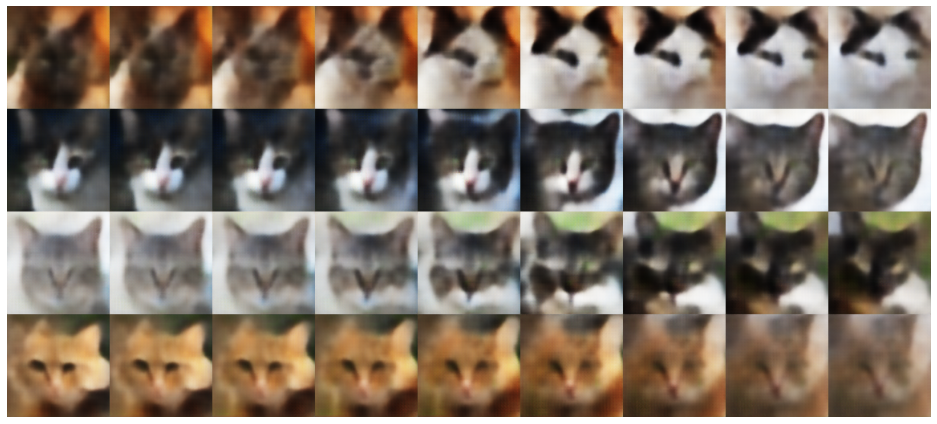

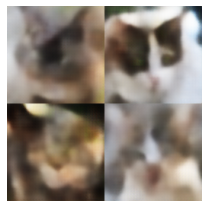


Epoch 171 | Reconstruction loss: 2910.0152718680247 | KLD loss: 335.77723205755956



Epoch 172 | Reconstruction loss: 2913.59074449243 | KLD loss: 336.1238916053535



Epoch 173 | Reconstruction loss: 2914.277493305088 | KLD loss: 335.9870288446083



Epoch 174 | Reconstruction loss: 2913.330287577943 | KLD loss: 335.52415674813784



Epoch 175 | Reconstruction loss: 2899.645067297894 | KLD loss: 335.0631487828604



Epoch 176 | Reconstruction loss: 2896.24168860394 | KLD loss: 334.9673278050393



Epoch 177 | Reconstruction loss: 2882.106496111947 | KLD loss: 334.1060951185523



Epoch 178 | Reconstruction loss: 2885.770744371118 | KLD loss: 334.5324886156165



Epoch 179 | Reconstruction loss: 2881.7698995459896 | KLD loss: 333.7215469549902



Epoch 180 | Reconstruction loss: 2868.571951919461 | KLD loss: 334.05409747769374


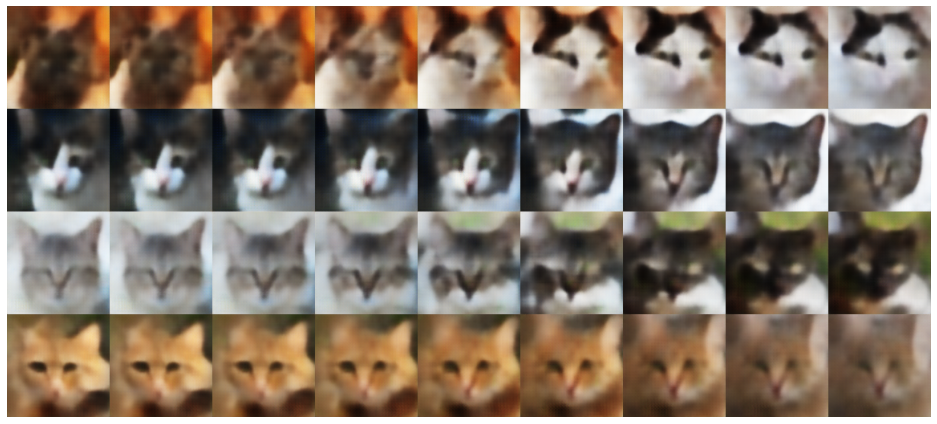

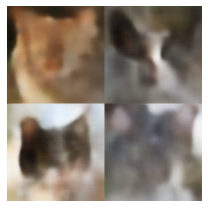


Epoch 181 | Reconstruction loss: 2884.990058661988 | KLD loss: 336.11894079172833



Epoch 182 | Reconstruction loss: 2870.7840691797483 | KLD loss: 333.6266840111395



Epoch 183 | Reconstruction loss: 2867.7806123532123 | KLD loss: 333.14397691051414



Epoch 184 | Reconstruction loss: 2868.6156506271836 | KLD loss: 332.5836499137168



Epoch 185 | Reconstruction loss: 2867.304765405122 | KLD loss: 332.2402722376474



Epoch 186 | Reconstruction loss: 2856.0630379433956 | KLD loss: 332.3673723114203



Epoch 187 | Reconstruction loss: 2853.286657866484 | KLD loss: 331.973088140073



Epoch 188 | Reconstruction loss: 2856.5408891950333 | KLD loss: 332.8266550857828



Epoch 189 | Reconstruction loss: 2836.0647088281858 | KLD loss: 332.73120178791305



Epoch 190 | Reconstruction loss: 2838.6517995514487 | KLD loss: 332.80737243083695


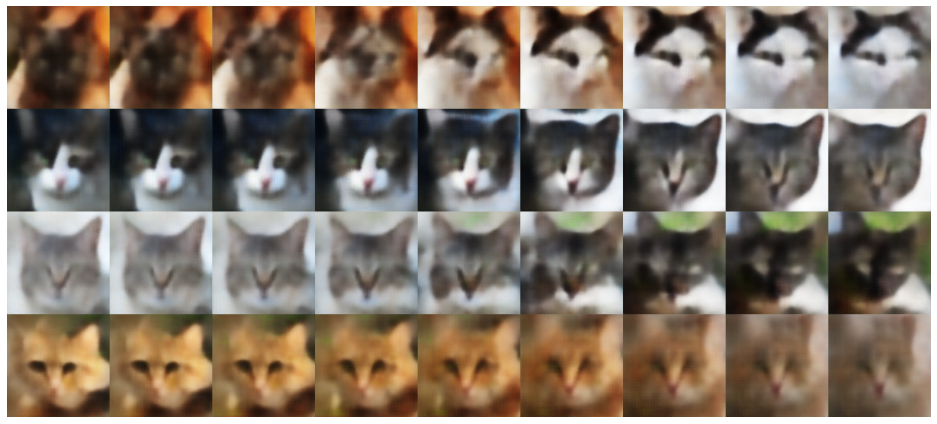

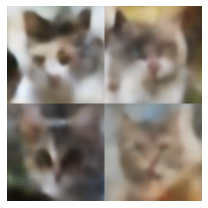


Epoch 191 | Reconstruction loss: 2838.647937277089 | KLD loss: 331.41235517418903



Epoch 192 | Reconstruction loss: 2838.6822813045906 | KLD loss: 331.72251512989493



Epoch 193 | Reconstruction loss: 2834.303343020611 | KLD loss: 330.6272578742934



Epoch 194 | Reconstruction loss: 2825.5320705627064 | KLD loss: 330.3222176688058



Epoch 195 | Reconstruction loss: 2824.09723317401 | KLD loss: 329.2655011763484



Epoch 196 | Reconstruction loss: 2814.624829404843 | KLD loss: 329.76101457110104



Epoch 197 | Reconstruction loss: 2818.81883666234 | KLD loss: 328.74675708083635



Epoch 198 | Reconstruction loss: 2804.1367367572666 | KLD loss: 328.18478085535656



Epoch 199 | Reconstruction loss: 2812.2206235139265 | KLD loss: 328.45332459633397



Epoch 200 | Reconstruction loss: 2803.2193573187596 | KLD loss: 329.0778561230772


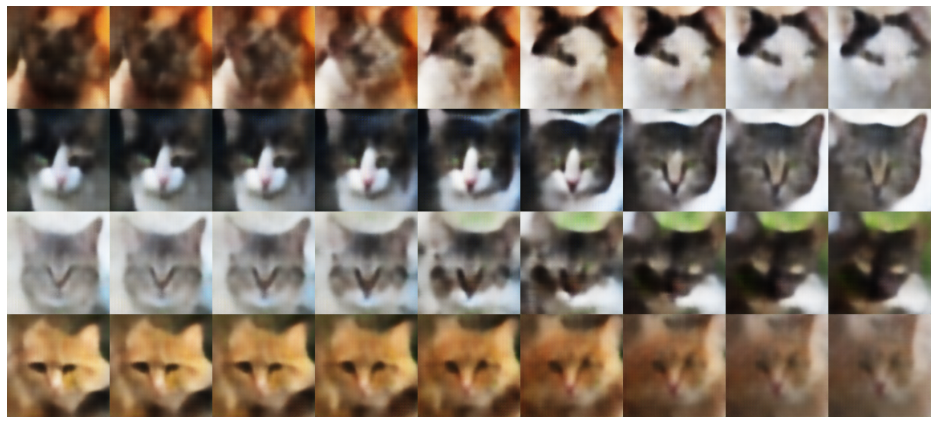

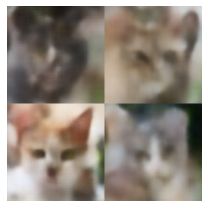


Epoch 201 | Reconstruction loss: 2802.5161853103164 | KLD loss: 327.5371718317826


In [13]:
def train_vae():
    vae = VAE()
    vae.cuda()

    epochs = 201
    batch_size = 8
    vae_optim = Adam(vae.parameters(), lr=1e-4)

    dataset = CatDataset(size=128)

    test_imgs_1 = torch.cat([dataset[i].unsqueeze(0) for i in (0, 34, 76, 1509)])
    test_imgs_2 = torch.cat([dataset[i].unsqueeze(0) for i in (734, 123, 512, 3634)])

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        rec_loss_avg = 0
        kld_loss_avg = 0

        if ep % 10 == 0:
            with torch.no_grad():
                z_1 = vae.encode(test_imgs_1.cuda())
                z_2 = vae.encode(test_imgs_2.cuda())
                x_int = []
                for i in range(9):
                    z = (i * z_1 + (8 - i) * z_2) / 8
                    x_int.append(vae.decode(z))
                x_int = torch.cat(x_int)
                visualise(x_int, rows=len(test_imgs_1))
                z_rand = torch.randn_like(z_1)
                x_int = vae.decode(z_rand)
                visualise(x_int, rows=len(test_imgs_1)//2)

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            x = batch.cuda()
            x_rec, kld = vae(x)
            img_elems = float(np.prod(list(batch.size())))
            kld_loss = kld.sum() / batch_size
            rec_loss = ((x_rec - x)**2).sum() / batch_size
            loss = rec_loss + 0.1 * kld_loss # https://openreview.net/forum?id=Sy2fzU9gl
            vae_optim.zero_grad()
            loss.backward()
            vae_optim.step()
            kld_loss_avg += kld_loss.item()
            rec_loss_avg += rec_loss.item()

        print(f"Epoch {ep+1} | Reconstruction loss: {rec_loss_avg / total_batches} | KLD loss: {kld_loss_avg / total_batches}")

train_vae()